In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pygal

In [2]:
data = pd.read_csv('results.csv')

In [3]:
data.head(5)

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
0,1872-11-30,Scotland,England,0,0,Friendly,Glasgow,Scotland,False
1,1873-03-08,England,Scotland,4,2,Friendly,London,England,False
2,1874-03-07,Scotland,England,2,1,Friendly,Glasgow,Scotland,False
3,1875-03-06,England,Scotland,2,2,Friendly,London,England,False
4,1876-03-04,Scotland,England,3,0,Friendly,Glasgow,Scotland,False


In [4]:
len(data)

40945

In [5]:
data.isnull().sum()

date          0
home_team     0
away_team     0
home_score    0
away_score    0
tournament    0
city          0
country       0
neutral       0
dtype: int64

In [16]:
data['home_team'].unique()

array(['Scotland', 'England', 'Wales', 'Northern Ireland',
       'United States', 'Uruguay', 'Austria', 'Hungary', 'Argentina',
       'Belgium', 'France', 'Netherlands', 'Czechoslovakia',
       'Switzerland', 'Sweden', 'Germany', 'Italy', 'Chile', 'Norway',
       'Finland', 'Luxembourg', 'Russia', 'Denmark', 'Catalonia',
       'Basque Country', 'Brazil', 'Japan', 'Paraguay', 'Canada',
       'Estonia', 'Costa Rica', 'Guatemala', 'Spain', 'Brittany',
       'Poland', 'Yugoslavia', 'New Zealand', 'Romania', 'Latvia',
       'Galicia', 'Portugal', 'Andalusia', 'China PR', 'Australia',
       'Lithuania', 'Turkey', 'Central Spain', 'Mexico', 'Aruba', 'Egypt',
       'Haiti', 'Philippines', 'Bulgaria', 'Jamaica', 'Kenya', 'Bolivia',
       'Peru', 'Honduras', 'Guyana', 'Uganda', 'Belarus', 'El Salvador',
       'Barbados', 'Republic of Ireland', 'Trinidad and Tobago', 'Greece',
       'Curaçao', 'Dominica', 'Silesia', 'Guadeloupe', 'Israel',
       'Suriname', 'French Guiana', 'Cuba', 

In [17]:
data['away_team'].unique()

array(['England', 'Scotland', 'Wales', 'Northern Ireland', 'Canada',
       'Argentina', 'Hungary', 'Czechoslovakia', 'Uruguay', 'France',
       'Austria', 'Switzerland', 'Netherlands', 'Belgium', 'Germany',
       'Norway', 'Sweden', 'Italy', 'Chile', 'Catalonia', 'Finland',
       'Russia', 'Luxembourg', 'Denmark', 'Brazil', 'Basque Country',
       'United States', 'Philippines', 'Estonia', 'Provence',
       'El Salvador', 'Costa Rica', 'Paraguay', 'Yugoslavia', 'Poland',
       'Portugal', 'Spain', 'Romania', 'Australia', 'Central Spain',
       'Mexico', 'Galicia', 'Brittany', 'Asturias', 'China PR',
       'New Zealand', 'Latvia', 'Guatemala', 'Curaçao', 'Bulgaria',
       'Lithuania', 'Turkey', 'Egypt', 'South Africa', 'Jamaica', 'Japan',
       'Republic of Ireland', 'Uganda', 'Bolivia', 'Haiti',
       'Trinidad and Tobago', 'Kenya', 'Ukraine', 'Honduras', 'Nicaragua',
       'Greece', 'Guyana', 'Peru', 'Aruba', 'Martinique', 'Barbados',
       'Cuba', 'Israel', 'Indonesia',

In [6]:
data['Year'] = pd.DatetimeIndex(data['date']).year
data['Month'] = pd.DatetimeIndex(data['date']).month
data['Day'] = pd.DatetimeIndex(data['date']).day

In [7]:
data.head(15)

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,Year,Month,Day
0,1872-11-30,Scotland,England,0,0,Friendly,Glasgow,Scotland,False,1872,11,30
1,1873-03-08,England,Scotland,4,2,Friendly,London,England,False,1873,3,8
2,1874-03-07,Scotland,England,2,1,Friendly,Glasgow,Scotland,False,1874,3,7
3,1875-03-06,England,Scotland,2,2,Friendly,London,England,False,1875,3,6
4,1876-03-04,Scotland,England,3,0,Friendly,Glasgow,Scotland,False,1876,3,4
5,1876-03-25,Scotland,Wales,4,0,Friendly,Glasgow,Scotland,False,1876,3,25
6,1877-03-03,England,Scotland,1,3,Friendly,London,England,False,1877,3,3
7,1877-03-05,Wales,Scotland,0,2,Friendly,Wrexham,Wales,False,1877,3,5
8,1878-03-02,Scotland,England,7,2,Friendly,Glasgow,Scotland,False,1878,3,2
9,1878-03-23,Scotland,Wales,9,0,Friendly,Glasgow,Scotland,False,1878,3,23


In [20]:
data['tournament'].unique()

array(['Friendly', 'British Championship', 'Copa Lipton', 'Copa Newton',
       'Copa Premio Honor Argentino', 'Copa Premio Honor Uruguayo',
       'Copa Roca', 'Copa América', 'Copa Chevallier Boutell',
       'Nordic Championship', 'International Cup', 'Baltic Cup',
       'Balkan Cup', 'FIFA World Cup', 'Copa Rio Branco',
       'FIFA World Cup qualification', 'CCCF Championship',
       'NAFU Championship', 'Copa Oswaldo Cruz',
       'Pan American Championship', 'Copa del Pacífico',
       "Copa Bernardo O'Higgins", 'AFC Asian Cup qualification',
       'Atlantic Cup', 'AFC Asian Cup', 'African Cup of Nations',
       'Copa Paz del Chaco', 'Merdeka Tournament',
       'UEFA Euro qualification', 'UEFA Euro',
       'Windward Islands Tournament',
       'African Cup of Nations qualification', 'Vietnam Independence Cup',
       'Copa Carlos Dittborn', 'CONCACAF Championship',
       'Copa Juan Pinto Durán', 'UAFA Cup', 'South Pacific Games',
       'CONCACAF Championship qualificatio

In [21]:
data['home'] = 0
data['away'] = 0
for i in range(len(data)):
    home = data['home_score'][i]
    away = data['away_score'][i]
    if home > away :
        data['home'][i] = 2
        data['away'][i] = 1
    elif home < away:
        data['away'][i] = 2
        data['home'][i] = 1
    if i%1000 == 0:
        print(i)
    

0


C:\Users\asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
C:\Users\asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Users\asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWar

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000


In [22]:
data.head(5)

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,Year,Month,Day,home,away
0,1872-11-30,Scotland,England,0,0,Friendly,Glasgow,Scotland,False,1872,11,30,0,0
1,1873-03-08,England,Scotland,4,2,Friendly,London,England,False,1873,3,8,2,1
2,1874-03-07,Scotland,England,2,1,Friendly,Glasgow,Scotland,False,1874,3,7,2,1
3,1875-03-06,England,Scotland,2,2,Friendly,London,England,False,1875,3,6,0,0
4,1876-03-04,Scotland,England,3,0,Friendly,Glasgow,Scotland,False,1876,3,4,2,1


In [23]:
data.describe()

,home_score,away_score,Year,Month,Day,home,away
count,40945.000000,40945.000000,40945.000000,40945.000000,40945.000000,40945.000000,40945.000000
mean,1.745463,1.188521,1990.024399,6.753083,15.293076,1.255367,1.051801
std,1.748619,1.405116,24.196213,3.233223,8.689514,0.807501,0.714855
min,0.000000,0.000000,1872.000000,1.000000,1.000000,0.000000,0.000000
25%,1.000000,0.000000,1977.000000,4.000000,8.000000,1.000000,1.000000
50%,1.000000,1.000000,1997.000000,6.000000,15.000000,1.000000,1.000000
75%,2.000000,2.000000,2008.000000,10.000000,23.000000,2.000000,2.000000
max,31.000000,21.000000,2019.000000,12.000000,31.000000,2.000000,2.000000


In [46]:
temp = data.groupby('home_team')['date'].agg(['count'])
temp.head(15)

,count
home_team,
Abkhazia,18
Afghanistan,37
Albania,173
Alderney,7
Algeria,288
American Samoa,24
Andalusia,12
Andorra,81
Angola,168


In [47]:
temp = temp.reset_index()
temp.head(15)

,home_team,count
0,Abkhazia,18
1,Afghanistan,37
2,Albania,173
3,Alderney,7
4,Algeria,288
5,American Samoa,24
6,Andalusia,12
7,Andorra,81
8,Angola,168
9,Anguilla,17


In [50]:
temp.sort_values(by='count' ,ascending=False)

,home_team,count
35,Brazil,565
12,Argentina,547
173,Mexico,510
104,Germany,502
85,England,491
263,Sweden,484
96,France,482
253,South Korea,464
124,Hungary,451
134,Italy,441


In [61]:
temp = temp[temp['count']>400]
temp.sort_values(by='count' ,ascending=False)

,home_team,count
35,Brazil,565
12,Argentina,547
173,Mexico,510
104,Germany,502
85,England,491
263,Sweden,484
96,France,482
253,South Korea,464
124,Hungary,451
134,Italy,441


In [70]:
temp.index = temp['home_team']
temp = temp.sort_values(by='count' ,ascending=False)
temp.head(15)

,home_team,count
home_team,,
Brazil,Brazil,565
Argentina,Argentina,547
Mexico,Mexico,510
Germany,Germany,502
England,England,491
Sweden,Sweden,484
France,France,482
South Korea,South Korea,464
Hungary,Hungary,451


Text(0.5, 1.0, 'Top Teams from 1872 to 2019 in number of playing as host')

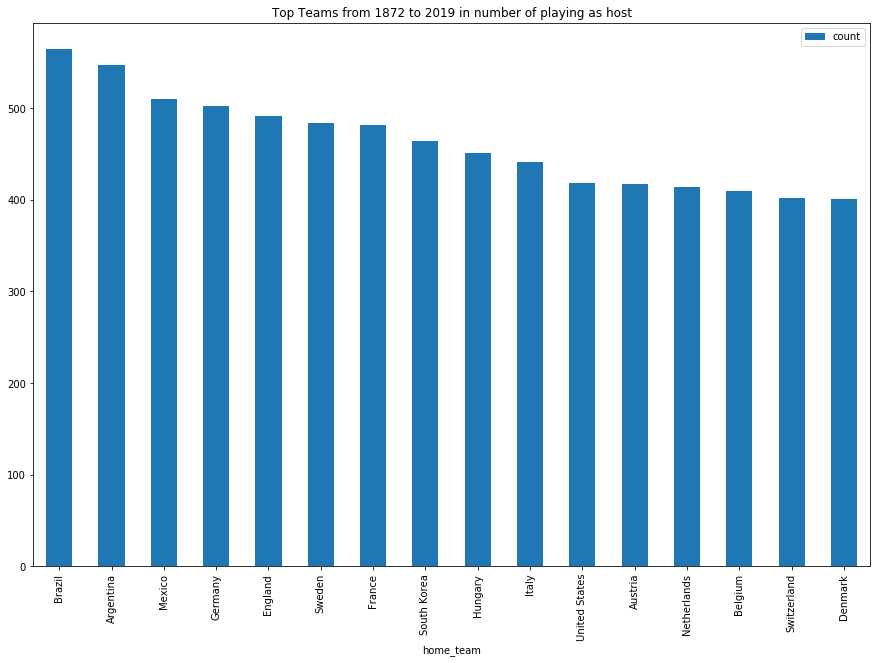

In [71]:
temp.plot(kind="bar",figsize=(15,10))
plt.title('Top Teams from 1872 to 2019 in number of playing as host')

In [82]:
temp = data.groupby(['Year','home_team'])['date'].agg(['count'])
temp.head(15)

count
Year home_team              
1872 Scotland              1
1873 England               1
1874 Scotland              1
1875 England               1
1876 Scotland              2
1877 England               1
     Wales                 1
1878 Scotland              2
1879 England               2
     Wales                 1
1880 Scotland              2
     Wales                 1
1881 England               2
     Wales                 1
1882 Northern Ireland      1

In [83]:
temp.sort_values(by='count' ,ascending=False).head(15)

,,count
Year,home_team,
1993,United States,23
1994,United States,22
2001,Oman,21
2008,Trinidad and Tobago,20
1996,Oman,20
2007,Mexico,19
1993,Mexico,18
2006,Saudi Arabia,18
2000,Malaysia,18


In [84]:
temp = temp.reset_index()
temp.head(15)

,Year,home_team,count
0,1872,Scotland,1
1,1873,England,1
2,1874,Scotland,1
3,1875,England,1
4,1876,Scotland,2
5,1877,England,1
6,1877,Wales,1
7,1878,Scotland,2
8,1879,England,2
9,1879,Wales,1


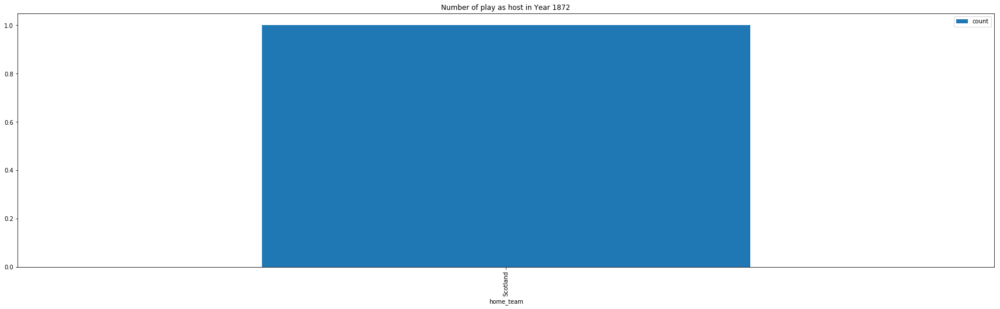

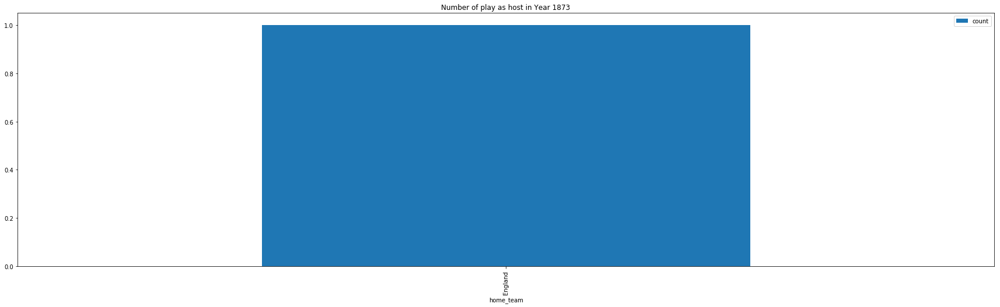

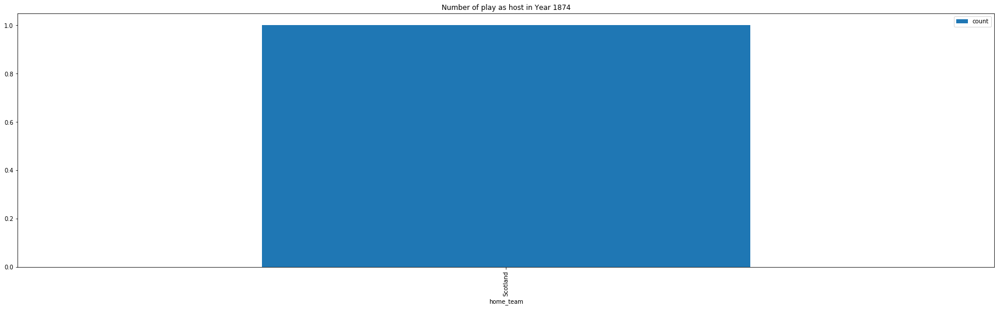

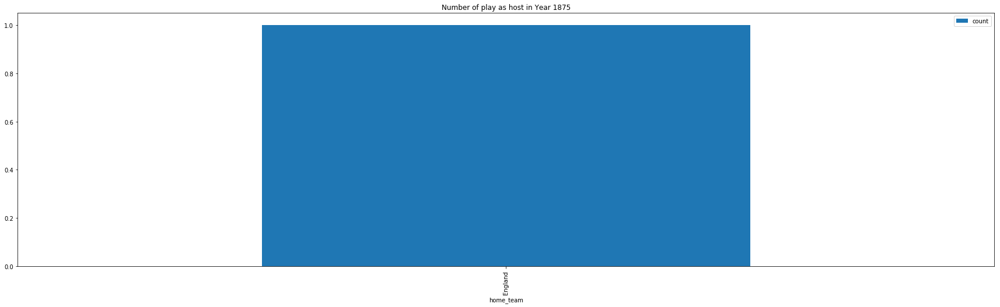

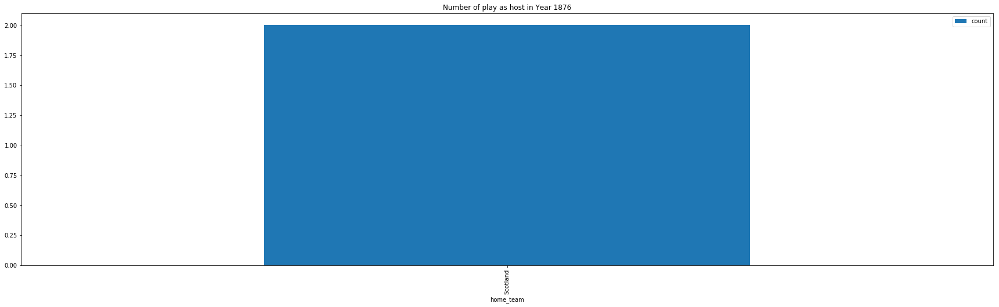

...

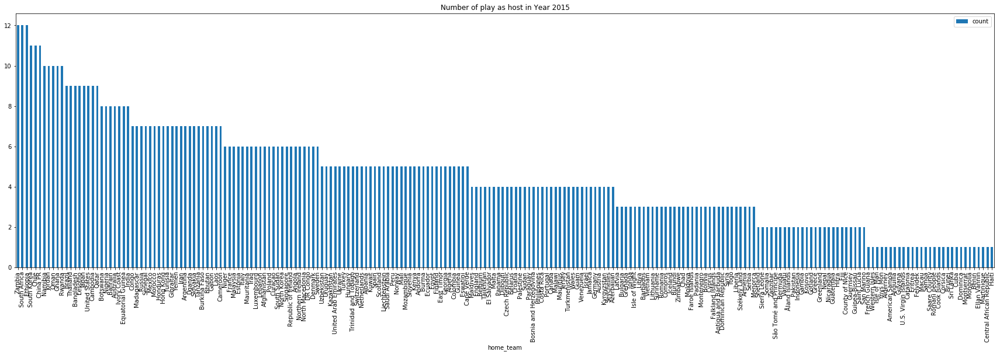

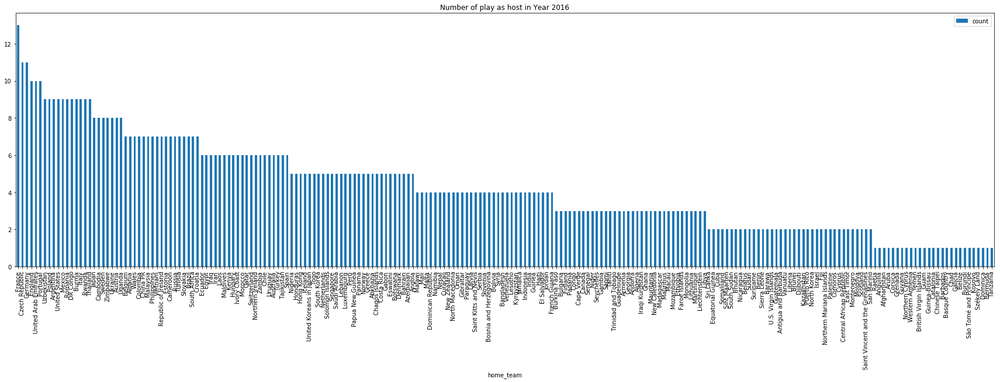

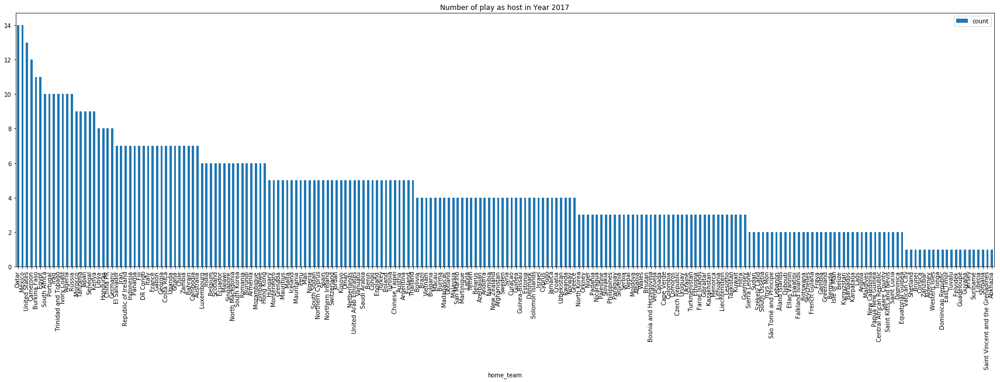

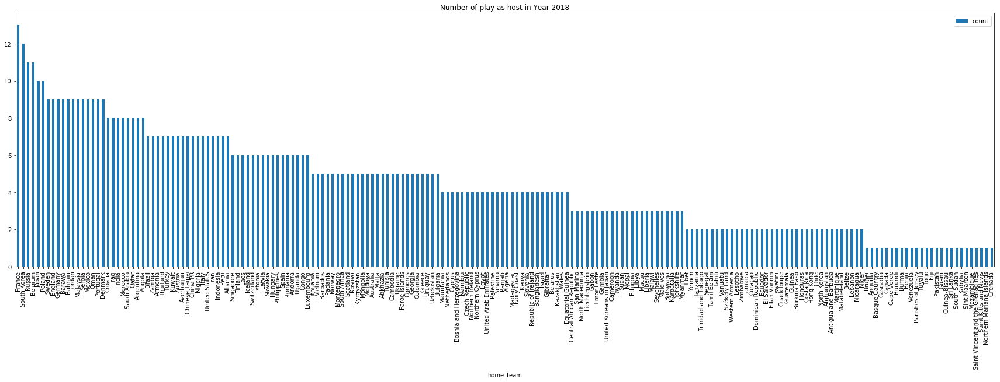

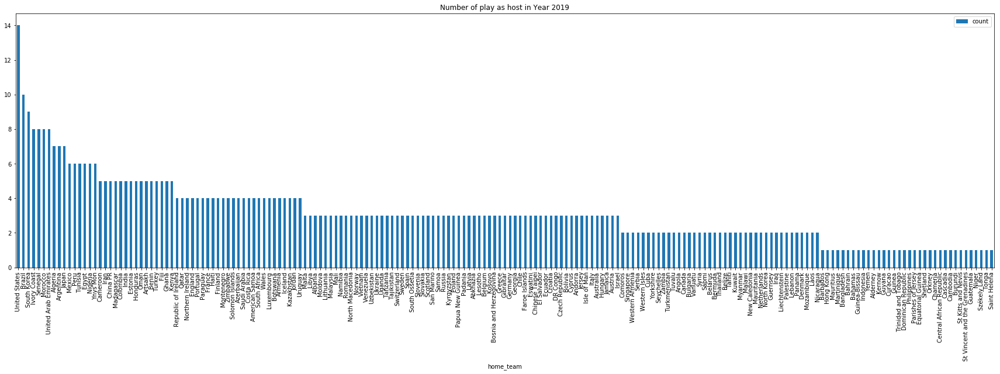

In [89]:
for i in range(1872,2020):
    data1 = temp[temp['Year'] == i]
    data1 = data1[['home_team','count']]
    data1.index = data1['home_team']
    data1 = data1.sort_values(by='count' ,ascending=False)
    data1.plot(kind="bar",figsize=(30,8))
    plt.title('Number of play as host in Year ' + str(i))
plt.show()

In [90]:
temp = data.groupby(['Year','away_team'])['date'].agg(['count'])
temp.head(15)

count
Year away_team       
1872 England        1
1873 Scotland       1
1874 England        1
1875 Scotland       1
1876 England        1
     Wales          1
1877 Scotland       2
1878 England        1
     Wales          1
1879 Scotland       2
     Wales          1
1880 England        2
     Wales          1
1881 Scotland       2
     Wales          1

In [91]:
temp.sort_values(by='count' ,ascending=False).head(15)

count
Year away_team         
2010 North Korea     18
2005 Panama          17
2004 Jordan          17
     Bahrain         17
1998 Mozambique      17
1971 Malaysia        16
1993 Bolivia         16
1989 Paraguay        16
1972 Singapore       16
2004 Syria           16
1996 Ghana           16
2013 Nigeria         15
2011 Venezuela       15
1996 Cuba            15
2011 Sudan           15

In [92]:
temp = temp.reset_index()
temp.head(15)

,Year,away_team,count
0,1872,England,1
1,1873,Scotland,1
2,1874,England,1
3,1875,Scotland,1
4,1876,England,1
5,1876,Wales,1
6,1877,Scotland,2
7,1878,England,1
8,1878,Wales,1
9,1879,Scotland,2


In [ ]:
for i in range(1872,2020):
    data1 = temp[temp['Year'] == i]
    data1 = data1[['away_team','count']]
    data1.index = data1['away_team']
    data1 = data1.sort_values(by='count' ,ascending=False)
    data1.plot(kind="bar",figsize=(30,8))
    plt.title('Number of play as guest in Year ' + str(i))
plt.show()

In [24]:
data.groupby('Year')['date'].agg(['count']).head(5)

,count
Year,
1872,1
1873,1
1874,1
1875,1
1876,2
1877,2
1878,2
1879,3
1880,3


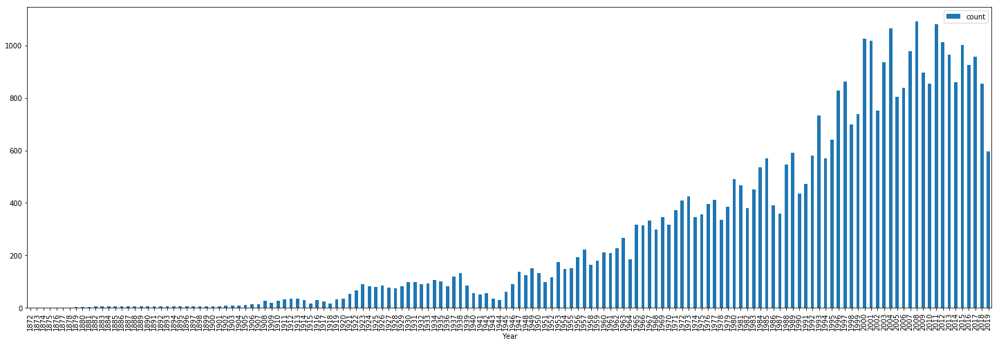

In [25]:
data.groupby('Year')['date'].agg(['count']).plot(kind="bar",figsize=(25,8))

In [26]:
data.groupby('tournament')['date'].agg(['count'])

,count
tournament,
ABCS Tournament,20
AFC Asian Cup,370
AFC Asian Cup qualification,724
AFC Challenge Cup,100
AFC Challenge Cup qualification,92
AFF Championship,293
AFF Championship qualification,2
African Cup of Nations,690
African Cup of Nations qualification,1616


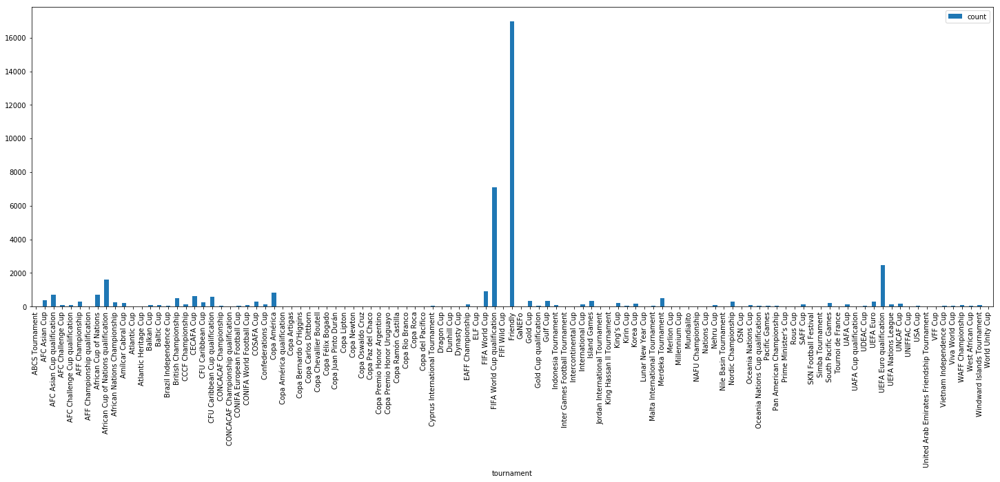

In [27]:
data.groupby('tournament')['date'].agg(['count']).plot(kind="bar",figsize=(25,8))

### realation between world cup & number of play

In [28]:
years = []
for i in range(1930,2019,4):
    if i!= 1942 and i != 1946:
        years.append(i-1)
        years.append(i)
years

[1929,
 1930,
 1933,
 1934,
 1937,
 1938,
 1949,
 1950,
 1953,
 1954,
 1957,
 1958,
 1961,
 1962,
 1965,
 1966,
 1969,
 1970,
 1973,
 1974,
 1977,
 1978,
 1981,
 1982,
 1985,
 1986,
 1989,
 1990,
 1993,
 1994,
 1997,
 1998,
 2001,
 2002,
 2005,
 2006,
 2009,
 2010,
 2013,
 2014,
 2017,
 2018]

In [29]:
data['game_for_world_cup'] = 0
for i in range(len(data)):
    year = data['Year'][i]
    game_type = data['tournament'][i]
    if year in years:
        if game_type == 'Friendly':
            data['game_for_world_cup'][i] = 1   
    if i%1000 == 0:
        print(i)

0
1000


C:\Users\asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000


In [30]:
temp = data.groupby(['Year','game_for_world_cup'])['date'].agg(['count'])

In [31]:
temp = temp.reset_index()

In [32]:
temp.describe()

,Year,game_for_world_cup,count
count,190.000000,190.000000,190.000000
mean,1952.321053,0.221053,215.500000
std,41.768030,0.416052,255.573962
min,1872.000000,0.000000,1.000000
25%,1919.250000,0.000000,33.000000
50%,1956.500000,0.000000,109.000000
75%,1987.750000,0.000000,319.250000
max,2019.000000,1.000000,1091.000000


C:\Users\asus\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


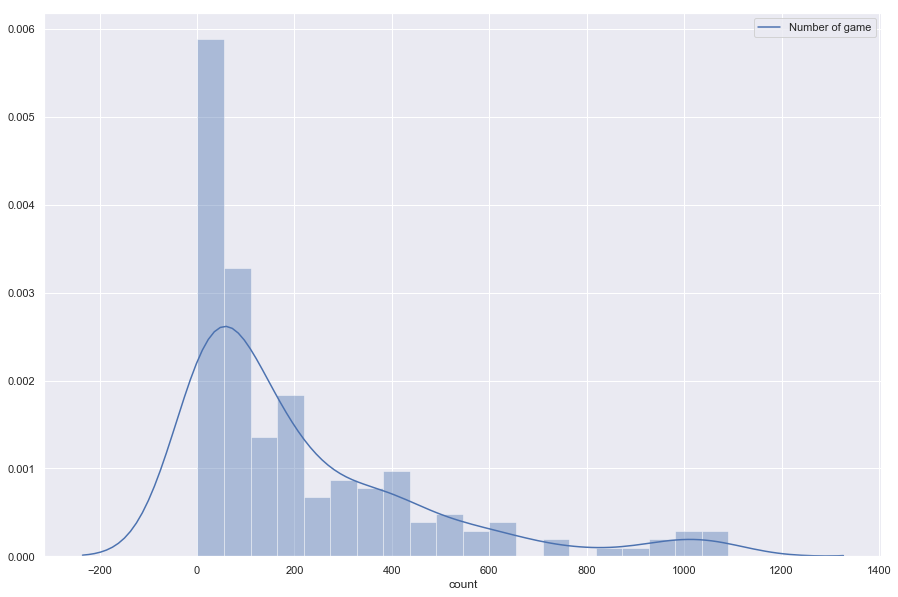

In [33]:
sns.set(rc={'figure.figsize':(15,10)})
sns.distplot(temp['count'],kde_kws={"label": 'Number of game'}, bins=20)

In [34]:
print(stats.normaltest(temp["count"]))

NormaltestResult(statistic=67.80543347013112, pvalue=1.8890228028719755e-15)


In [35]:
temp['count_log_e'] = np.log(temp['count'])
temp.head(5)

,Year,game_for_world_cup,count,count_log_e
0,1872,0,1,0.000000
1,1873,0,1,0.000000
2,1874,0,1,0.000000
3,1875,0,1,0.000000
4,1876,0,2,0.693147


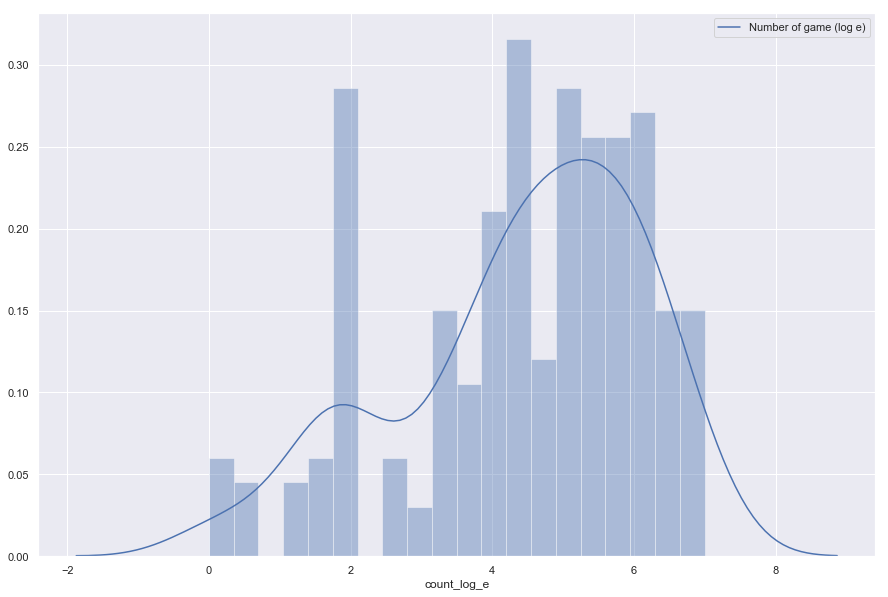

In [36]:
sns.set(rc={'figure.figsize':(15,10)})
sns.distplot(temp['count_log_e'],kde_kws={"label": 'Number of game (log e)'}, bins=20)

In [37]:
print(stats.normaltest(temp["count_log_e"]))

NormaltestResult(statistic=14.744476527770004, pvalue=0.0006284599444882391)


In [38]:
temp['count_log_10'] = np.log10(temp['count'])
temp.head(5)

,Year,game_for_world_cup,count,count_log_e,count_log_10
0,1872,0,1,0.000000,0.00000
1,1873,0,1,0.000000,0.00000
2,1874,0,1,0.000000,0.00000
3,1875,0,1,0.000000,0.00000
4,1876,0,2,0.693147,0.30103


In [39]:
print(stats.normaltest(temp["count_log_10"]))

NormaltestResult(statistic=14.744476527769963, pvalue=0.0006284599444882521)


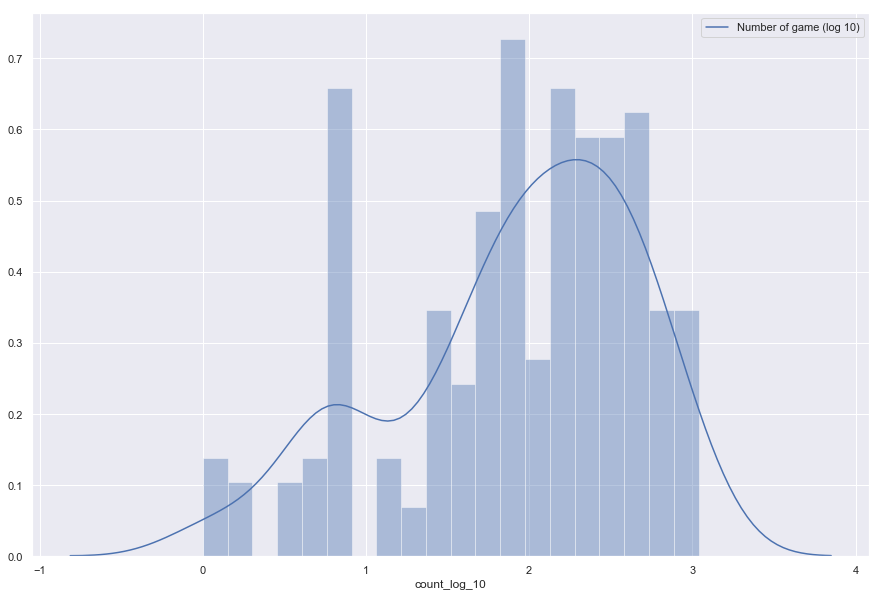

In [40]:
sns.set(rc={'figure.figsize':(15,10)})
sns.distplot(temp['count_log_10'],kde_kws={"label": 'Number of game (log 10)'}, bins=20)

In [41]:
temp['count_sqrt'] = np.sqrt(temp['count'])
temp.head(5)

,Year,game_for_world_cup,count,count_log_e,count_log_10,count_sqrt
0,1872,0,1,0.000000,0.00000,1.000000
1,1873,0,1,0.000000,0.00000,1.000000
2,1874,0,1,0.000000,0.00000,1.000000
3,1875,0,1,0.000000,0.00000,1.000000
4,1876,0,2,0.693147,0.30103,1.414214


In [42]:
print(stats.normaltest(temp["count_sqrt"]))

NormaltestResult(statistic=13.292268050031968, pvalue=0.0012990344451013964)


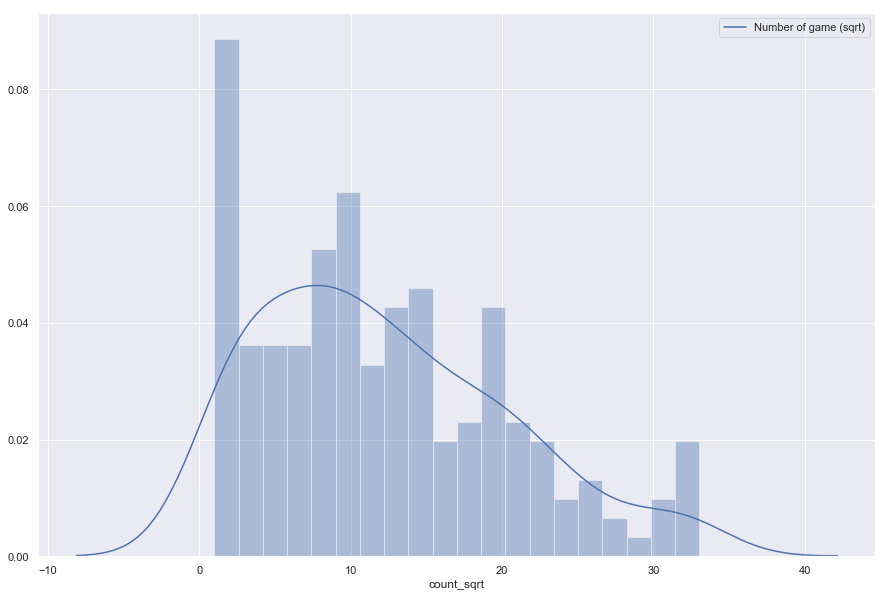

In [43]:
sns.set(rc={'figure.figsize':(15,10)})
sns.distplot(temp['count_sqrt'],kde_kws={"label": 'Number of game (sqrt)'}, bins=20)

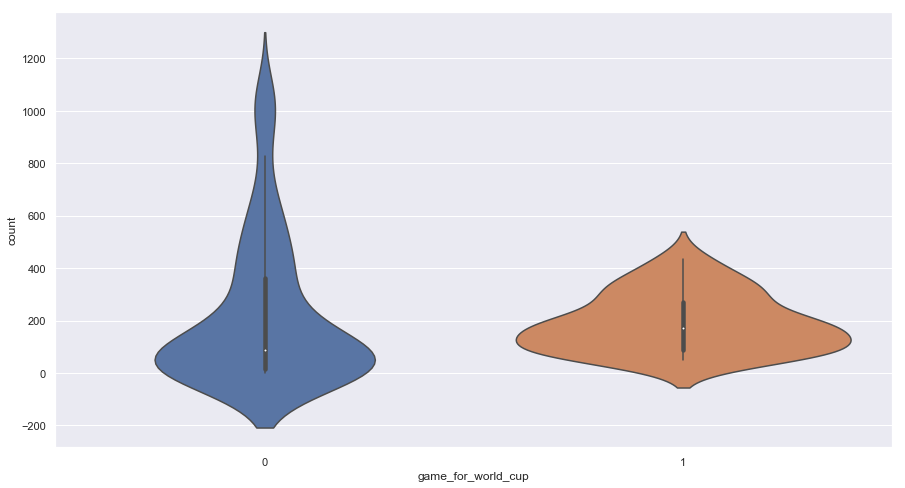

In [44]:
plt.figure(figsize=(15,8))
sns.violinplot("game_for_world_cup", "count", data=temp)

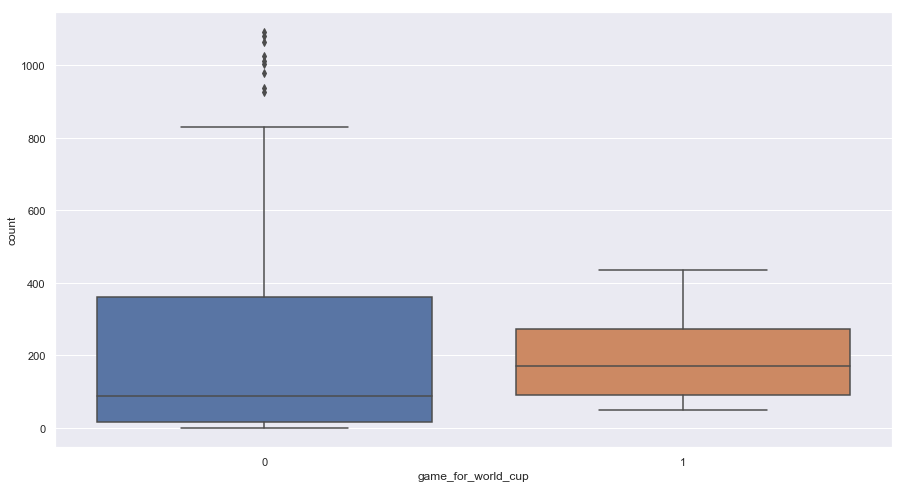

In [45]:
plt.figure(figsize=(15,8))
sns.boxplot("game_for_world_cup", "count", data=temp)

In [46]:
stats.wilcoxon(temp["game_for_world_cup"],temp['count'])

WilcoxonResult(statistic=0.0, pvalue=6.219181133270395e-33)

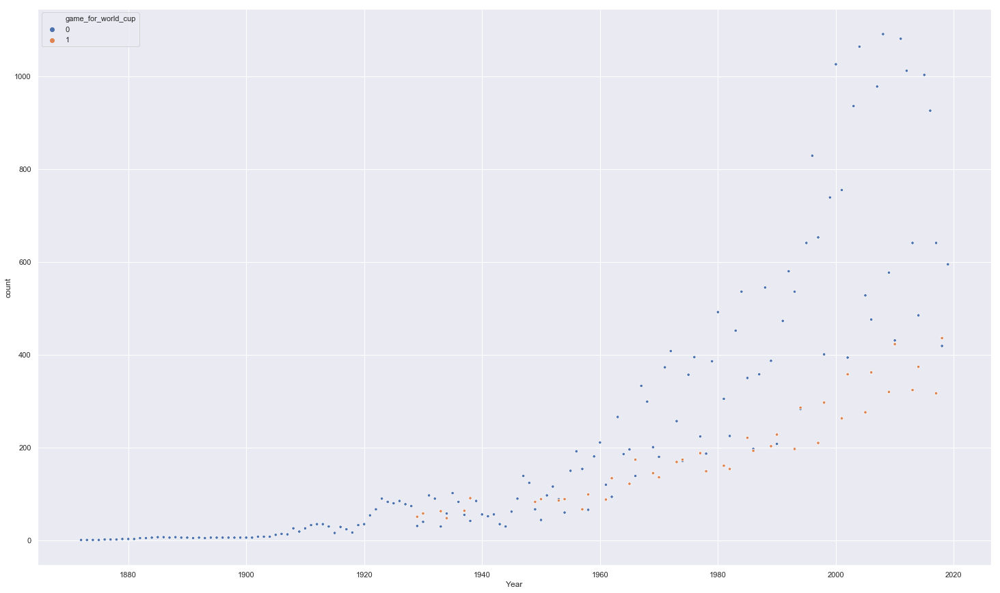

In [47]:
plt.figure(figsize=(25,15))
sns.scatterplot(x=temp['Year'], y=temp['count'], hue='game_for_world_cup',s=20, data=temp)

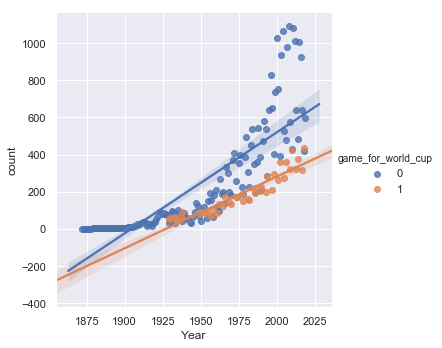

In [48]:
sns.set(rc={'figure.figsize':(30,20)})
sns.lmplot("Year","count", hue="game_for_world_cup", data=temp)

In [49]:
data.head(5)

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,Year,Month,Day,home,away,game_for_world_cup
0,1872-11-30,Scotland,England,0,0,Friendly,Glasgow,Scotland,False,1872,11,30,0,0,0
1,1873-03-08,England,Scotland,4,2,Friendly,London,England,False,1873,3,8,2,1,0
2,1874-03-07,Scotland,England,2,1,Friendly,Glasgow,Scotland,False,1874,3,7,2,1,0
3,1875-03-06,England,Scotland,2,2,Friendly,London,England,False,1875,3,6,0,0,0
4,1876-03-04,Scotland,England,3,0,Friendly,Glasgow,Scotland,False,1876,3,4,2,1,0


In [50]:
data['country'].unique()

array(['Scotland', 'England', 'Wales', 'Republic of Ireland',
       'United States', 'Uruguay', 'Austria', 'Hungary', 'Argentina',
       'Belgium', 'France', 'Netherlands', 'Bohemia', 'Switzerland',
       'Sweden', 'Germany', 'Italy', 'Chile', 'Norway', 'Finland',
       'Luxembourg', 'Russia', 'Denmark', 'Spain', 'Japan', 'Brazil',
       'Paraguay', 'China PR', 'Canada', 'Estonia', 'Guatemala',
       'Czechoslovakia', 'Poland', 'Yugoslavia', 'New Zealand', 'Romania',
       'Latvia', 'Portugal', 'Northern Ireland', 'Australia', 'Lithuania',
       'Turkey', 'Mexico', 'Aruba', 'Soviet Union', 'Haiti',
       'Philippines', 'Bulgaria', 'Jamaica', 'Kenya', 'Czech Republic',
       'Peru', 'Honduras', 'British Guyana', 'Uganda', 'El Salvador',
       'Barbados', 'Irish Free State', 'Trinidad and Tobago', 'Greece',
       'Curaçao', 'Egypt', 'Dominica', 'Guadeloupe', 'Palestine',
       'Netherlands Guyana', 'French Guiana', 'Cuba', 'Colombia',
       'Saint Kitts and Nevis', 'Éire', 

In [141]:
temp = data.groupby('country')['date'].agg(['count']).sort_values(('count'),ascending=False)
temp.head(20)

,count
country,
United States,1151
France,803
England,689
Malaysia,645
Sweden,638
Germany,582
Brazil,529
Spain,518
Thailand,483


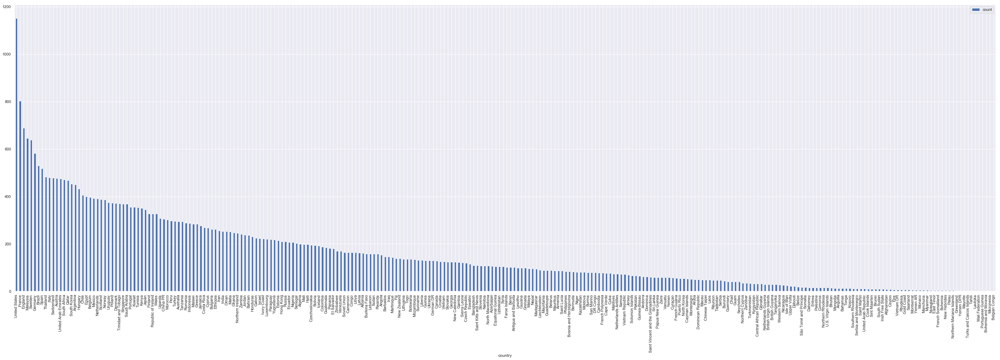

In [52]:
data.groupby('country')['date'].agg(['count']).sort_values(('count'),ascending=False).plot(kind="bar",figsize=(50,15))

In [148]:
data.groupby('tournament')['date'].agg(['count']).sort_values(('count'),ascending=False)

,count
tournament,
Friendly,16967
FIFA World Cup qualification,7100
UEFA Euro qualification,2482
African Cup of Nations qualification,1616
FIFA World Cup,900
Copa América,813
AFC Asian Cup qualification,724
African Cup of Nations,690
CECAFA Cup,620


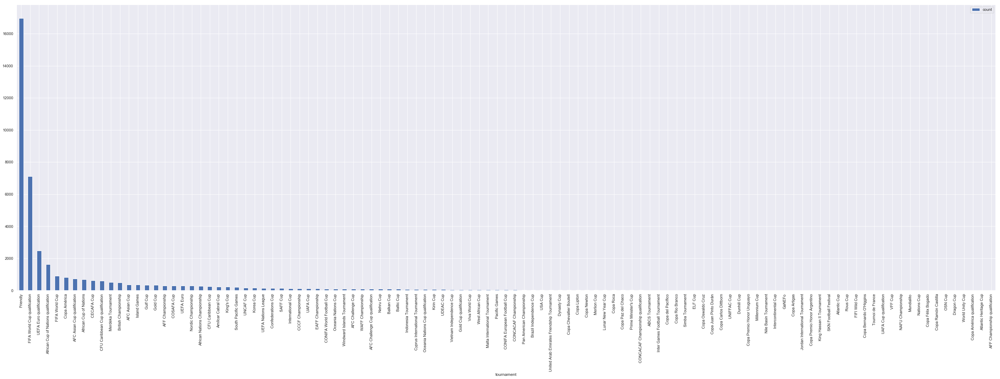

In [147]:
data.groupby('tournament')['date'].agg(['count']).sort_values(('count'),ascending=False).plot(kind="bar",figsize=(50,15))

In [149]:
data.groupby(['tournament','Year'])['date'].agg(['count']).sort_values(('count'),ascending=False)

count
tournament                   Year       
FIFA World Cup qualification 2001    489
Friendly                     2018    436
                             2010    423
FIFA World Cup qualification 2008    417
                             2004    412
Friendly                     2008    409
FIFA World Cup qualification 1997    408
Friendly                     2012    406
                             2011    380
                             2004    377
                             2000    376
                             2014    374
                             2006    362
                             2002    358
FIFA World Cup qualification 2005    353
                             2013    346
                             1993    336
Friendly                     2007    333
                             2003    332
                             2013    324
                             2009    320
                             2017    317
FIFA World Cup qualification 2017    310
                             2009    309
Friendly                     1996    305
                             1998    297
                             2016    289
                             1999    289
                             1994    286
                             2015    278
...                                  ...
Copa Roca                    1914      1
                             1922      1
NAFU Championship            1990      1
Copa Roca                    1923      1
Mundialito                   1980      1
Copa Premio Honor Uruguayo   1913      1
Copa Chevallier Boutell      1956      1
Copa Lipton                  1917      1
                             1905      1
                             1916      1
                             1915      1
                             1913      1
                             1912      1
                             1911      1
                             1910      1
                             1909      1
                             1908      1
                             1906      1
Copa Paz del Chaco           1999      1
Copa Premio Honor Argentino  1920      1
                             1908      1
Copa Juan Pinto Durán        1977      1
                             1976      1
Copa Premio Honor Argentino  1909      1
                             1911      1
                             1912      1
                             1913      1
                             1914      1
                             1919      1
Copa Newton                  1975      1

[1495 rows x 1 columns]

In [88]:
temp = data.groupby(['country','Year'])['date'].agg(['count']).sort_values(('count'),ascending=False)
temp.head(20)

,,count
country,Year,
Germany,2006,94
United States,1994,92
South Africa,2010,80
France,1998,77
Russia,2018,72
Brazil,2014,68
England,2018,64
Egypt,2019,62
France,2016,59


In [99]:
temp = data.groupby(['country','Year'])['date'].agg(['count']).sort_values(('count'),ascending=False).unstack('Year').fillna(0)

In [100]:
temp.head(20)

count                                               ...   \
Year                 1872 1873 1874 1875 1876 1877 1878 1879 1880 1881  ...    
country                                                                 ...    
Afghanistan           0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Albania               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Algeria               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Andorra               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Angola                0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Anguilla              0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Antigua and Barbuda   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Argentina             0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Armenia               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Aruba                 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Australia             0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Austria               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Azerbaijan            0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Bahamas               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Bahrain               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Bangladesh            0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Barbados              0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Belarus               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Belgian Congo         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
Belgium               0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    

                                                                                
Year                 2010  2011  2012  2013  2014  2015  2016 2017  2018  2019  
country                                                                         
Afghanistan           0.0   0.0   0.0   1.0   0.0   0.0   0.0  0.0   0.0   0.0  
Albania               6.0   6.0   4.0   5.0   2.0   5.0   5.0  7.0   5.0   3.0  
Algeria               3.0   3.0   4.0   6.0   4.0   4.0   4.0  8.0   2.0   2.0  
Andorra               2.0   3.0   3.0   3.0   3.0   5.0   2.0  3.0   3.0   3.0  
Angola               31.0   6.0   6.0   4.0   4.0   8.0   2.0  1.0   2.0   1.0  
Anguilla              1.0   1.0   0.0   0.0   0.0   1.0   1.0  0.0   1.0   0.0  
Antigua and Barbuda   9.0   7.0  20.0   0.0   1.0   3.0   2.0  0.0   2.0   0.0  
Argentina             5.0  34.0   4.0   3.0   4.0   3.0   4.0  3.0   3.0   1.0  
Armenia               5.0   2.0   4.0   4.0   2.0   3.0   3.0  6.0   5.0   4.0  
Aruba                 1.0   1.0   4.0   0.0   8.0   0.0   1.0  0.0   0.0   0.0  
Australia             3.0   5.0   2.0   4.0   4.0  38.0   6.0  7.0   4.0   0.0  
Austria              25.0   7.0  16.0   5.0  16.0   7.0  16.0  7.0  20.0   3.0  
Azerbaijan            2.0   5.0   3.0   5.0   3.0   4.0   1.0  4.0   5.0  24.0  
Bahamas               0.0   1.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   1.0  
Bahrain               5.0   6.0   5.0  21.0   4.0   7.0   5.0  6.0   9.0   2.0  
Bangladesh            0.0   3.0   0.0   0.0   2.0   8.0   7.0  0.0  13.0   1.0  
Barbados              1.0   4.0   6.0   0.0   0.0   3.0   1.0  1.0   5.0   0.0  
Belarus               3.0   4.0   3.0   5.0   4.0   3.0   2.0  4.0   4.0   2.0  
Belgian Congo         0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0  
Belgium               5.0   8.0   4.0   8.0   7.0   8.0   5.0  7.0  11.0   3.0  

[20 rows x 148 columns]

In [101]:
temp = temp.reset_index()

In [102]:
temp.head(15)

country count                                          ...   \
Year                       1872 1873 1874 1875 1876 1877 1878 1879 1880  ...    
0             Afghanistan   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
1                 Albania   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
2                 Algeria   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
3                 Andorra   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
4                  Angola   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
5                Anguilla   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
6     Antigua and Barbuda   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
7               Argentina   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
8                 Armenia   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
9                   Aruba   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
10              Australia   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
11                Austria   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
12             Azerbaijan   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
13                Bahamas   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    
14                Bahrain   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...    

                                                                 
Year  2010  2011  2012  2013  2014  2015  2016 2017  2018  2019  
0      0.0   0.0   0.0   1.0   0.0   0.0   0.0  0.0   0.0   0.0  
1      6.0   6.0   4.0   5.0   2.0   5.0   5.0  7.0   5.0   3.0  
2      3.0   3.0   4.0   6.0   4.0   4.0   4.0  8.0   2.0   2.0  
3      2.0   3.0   3.0   3.0   3.0   5.0   2.0  3.0   3.0   3.0  
4     31.0   6.0   6.0   4.0   4.0   8.0   2.0  1.0   2.0   1.0  
5      1.0   1.0   0.0   0.0   0.0   1.0   1.0  0.0   1.0   0.0  
6      9.0   7.0  20.0   0.0   1.0   3.0   2.0  0.0   2.0   0.0  
7      5.0  34.0   4.0   3.0   4.0   3.0   4.0  3.0   3.0   1.0  
8      5.0   2.0   4.0   4.0   2.0   3.0   3.0  6.0   5.0   4.0  
9      1.0   1.0   4.0   0.0   8.0   0.0   1.0  0.0   0.0   0.0  
10     3.0   5.0   2.0   4.0   4.0  38.0   6.0  7.0   4.0   0.0  
11    25.0   7.0  16.0   5.0  16.0   7.0  16.0  7.0  20.0   3.0  
12     2.0   5.0   3.0   5.0   3.0   4.0   1.0  4.0   5.0  24.0  
13     0.0   1.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   1.0  
14     5.0   6.0   5.0  21.0   4.0   7.0   5.0  6.0   9.0   2.0  

[15 rows x 149 columns]

In [56]:
temp = data.groupby(['country','tournament'])['date'].agg(['count']).sort_values(('count'),ascending=False).unstack('tournament').fillna(0)

In [57]:
temp.head(5)

count                                            \
tournament  ABCS Tournament AFC Asian Cup AFC Asian Cup qualification   
country                                                                 
Afghanistan             0.0           0.0                         0.0   
Albania                 0.0           0.0                         0.0   
Algeria                 0.0           0.0                         0.0   
Andorra                 0.0           0.0                         0.0   
Angola                  0.0           0.0                         0.0   

                                                               \
tournament  AFC Challenge Cup AFC Challenge Cup qualification   
country                                                         
Afghanistan               0.0                             0.0   
Albania                   0.0                             0.0   
Algeria                   0.0                             0.0   
Andorra                   0.0                             0.0   
Angola                    0.0                             0.0   

                                                             \
tournament  AFF Championship AFF Championship qualification   
country                                                       
Afghanistan              0.0                            0.0   
Albania                  0.0                            0.0   
Algeria                  0.0                            0.0   
Andorra                  0.0                            0.0   
Angola                   0.0                            0.0   

                                                                         \
tournament  African Cup of Nations African Cup of Nations qualification   
country                                                                   
Afghanistan                    0.0                                  0.0   
Albania                        0.0                                  0.0   
Algeria                       16.0                                 41.0   
Andorra                        0.0                                  0.0   
Angola                        29.0                                 36.0   

                                               ...                            \
tournament  African Nations Championship       ...       UNIFFAC Cup USA Cup   
country                                        ...                             
Afghanistan                          0.0       ...               0.0     0.0   
Albania                              0.0       ...               0.0     0.0   
Algeria                              1.0       ...               0.0     0.0   
Andorra                              0.0       ...               0.0     0.0   
Angola                               5.0       ...               0.0     0.0   

                                                                \
tournament  United Arab Emirates Friendship Tournament VFF Cup   
country                                                          
Afghanistan                                        0.0     0.0   
Albania                                            0.0     0.0   
Algeria                                            0.0     0.0   
Andorra                                            0.0     0.0   
Angola                                             0.0     0.0   

                                                                       \
tournament  Vietnam Independence Cup Viva World Cup WAFF Championship   
country                                                                 
Afghanistan                      0.0            0.0               0.0   
Albania                          0.0            0.0               0.0   
Algeria                          0.0            0.0               0.0   
Andorra                          0.0            0.0               0.0   
Angola                           0.0            0.0               0.0   

                                                       

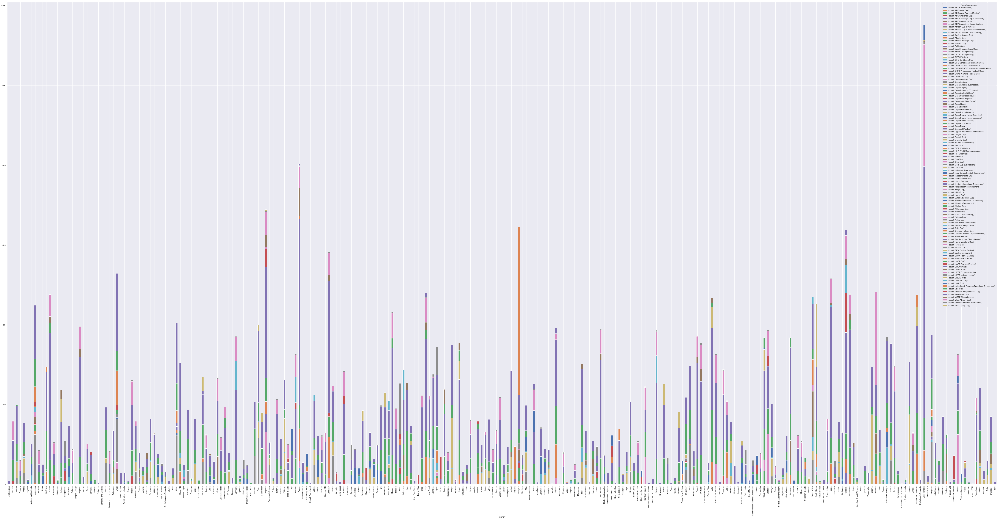

In [58]:
temp.plot(kind='bar', stacked=True,figsize=(100,50))

In [59]:
temp = temp.reset_index()

In [60]:
temp1 = temp[temp['country'].isin(['United States','France','England','Malaysia','Sweden','Germany','Brazil','Spain','Thailand','Italy','Switzerland','Austria','South Africa','Qatar'])]
temp1.head(5)

country           count                                            \
tournament          ABCS Tournament AFC Asian Cup AFC Asian Cup qualification   
11          Austria             0.0           0.0                         0.0   
29           Brazil             0.0           0.0                         0.0   
69          England             0.0           0.0                         0.0   
78           France             0.0           0.0                         0.0   
86          Germany             0.0           0.0                         0.0   

                                                                               \
tournament AFC Challenge Cup AFC Challenge Cup qualification AFF Championship   
11                       0.0                             0.0              0.0   
29                       0.0                             0.0              0.0   
69                       0.0                             0.0              0.0   
78                       0.0                             0.0              0.0   
86                       0.0                             0.0              0.0   

                                                                  \
tournament AFF Championship qualification African Cup of Nations   
11                                    0.0                    0.0   
29                                    0.0                    0.0   
69                                    0.0                    0.0   
78                                    0.0                    0.0   
86                                    0.0                    0.0   

                                                      ...                    \
tournament African Cup of Nations qualification       ...       UNIFFAC Cup   
11                                          0.0       ...               0.0   
29                                          0.0       ...               0.0   
69                                          0.0       ...               0.0   
78                                          0.0       ...               0.0   
86                                          0.0       ...               0.0   

                                                                       \
tournament USA Cup United Arab Emirates Friendship Tournament VFF Cup   
11             0.0                                        0.0     0.0   
29             0.0                                        0.0     0.0   
69             0.0                                        0.0     0.0   
78             0.0                                        0.0     0.0   
86             0.0                                        0.0     0.0   

                                                                      \
tournament Vietnam Independence Cup Viva World Cup WAFF Championship   
11                              0.0            0.0               0.0   
29                              0.0            0.0               0.0   
69                              0.0            0.0               0.0   
78                              0.0            4.0               0.0   
86                              0.0            0.0               0.0   

                                                                         
tournament West African Cup Windward Islands Tournament World Unity Cup  
11                      0.0                         0.0             0.0  
29                      0.0                         0.0             0.0  
69                      0.0                         0.0             4.0  
78                      0.0                         0.0             0.0  
86                      0.0                         0.0             0.0  

[5 rows x 110 columns]

In [61]:
temp1= temp[temp['country'].isin(['United States','France','England','Malaysia','Sweden','Germany','Brazil','Spain','Thailand','Italy','Switzerland','Austria','South Africa','Qatar'])]

In [62]:
temp1.head(5)

country           count                                            \
tournament          ABCS Tournament AFC Asian Cup AFC Asian Cup qualification   
11          Austria             0.0           0.0                         0.0   
29           Brazil             0.0           0.0                         0.0   
69          England             0.0           0.0                         0.0   
78           France             0.0           0.0                         0.0   
86          Germany             0.0           0.0                         0.0   

                                                                               \
tournament AFC Challenge Cup AFC Challenge Cup qualification AFF Championship   
11                       0.0                             0.0              0.0   
29                       0.0                             0.0              0.0   
69                       0.0                             0.0              0.0   
78                       0.0                             0.0              0.0   
86                       0.0                             0.0              0.0   

                                                                  \
tournament AFF Championship qualification African Cup of Nations   
11                                    0.0                    0.0   
29                                    0.0                    0.0   
69                                    0.0                    0.0   
78                                    0.0                    0.0   
86                                    0.0                    0.0   

                                                      ...                    \
tournament African Cup of Nations qualification       ...       UNIFFAC Cup   
11                                          0.0       ...               0.0   
29                                          0.0       ...               0.0   
69                                          0.0       ...               0.0   
78                                          0.0       ...               0.0   
86                                          0.0       ...               0.0   

                                                                       \
tournament USA Cup United Arab Emirates Friendship Tournament VFF Cup   
11             0.0                                        0.0     0.0   
29             0.0                                        0.0     0.0   
69             0.0                                        0.0     0.0   
78             0.0                                        0.0     0.0   
86             0.0                                        0.0     0.0   

                                                                      \
tournament Vietnam Independence Cup Viva World Cup WAFF Championship   
11                              0.0            0.0               0.0   
29                              0.0            0.0               0.0   
69                              0.0            0.0               0.0   
78                              0.0            4.0               0.0   
86                              0.0            0.0               0.0   

                                                                         
tournament West African Cup Windward Islands Tournament World Unity Cup  
11                      0.0                         0.0             0.0  
29                      0.0                         0.0             0.0  
69                      0.0                         0.0             4.0  
78                      0.0                         0.0             0.0  
86                      0.0                         0.0             0.0  

[5 rows x 110 columns]

In [63]:
temp1.index = temp1['country']

In [64]:
temp1

country           count                \
tournament                   ABCS Tournament AFC Asian Cup   
country                                                      
Austria              Austria             0.0           0.0   
Brazil                Brazil             0.0           0.0   
England              England             0.0           0.0   
France                France             0.0           0.0   
Germany              Germany             0.0           0.0   
Italy                  Italy             0.0           0.0   
Malaysia            Malaysia             0.0           8.0   
Qatar                  Qatar             0.0          56.0   
South Africa    South Africa             0.0           0.0   
Spain                  Spain             0.0           0.0   
Sweden                Sweden             0.0           0.0   
Switzerland      Switzerland             0.0           0.0   
Thailand            Thailand             0.0          20.0   
United States  United States             0.0           0.0   

                                                             \
tournament    AFC Asian Cup qualification AFC Challenge Cup   
country                                                       
Austria                               0.0               0.0   
Brazil                                0.0               0.0   
England                               0.0               0.0   
France                                0.0               0.0   
Germany                               0.0               0.0   
Italy                                 0.0               0.0   
Malaysia                             33.0              13.0   
Qatar                                28.0               0.0   
South Africa                          0.0               0.0   
Spain                                 0.0               0.0   
Sweden                                0.0               0.0   
Switzerland                           0.0               0.0   
Thailand                             57.0               0.0   
United States                         0.0               0.0   

                                                                \
tournament    AFC Challenge Cup qualification AFF Championship   
country                                                          
Austria                                   0.0              0.0   
Brazil                                    0.0              0.0   
England                                   0.0              0.0   
France                                    0.0              0.0   
Germany                                   0.0              0.0   
Italy                                     0.0              0.0   
Malaysia                                  4.0             29.0   
Qatar                                     0.0              0.0   
South Africa                              0.0              0.0   
Spain                                     0.0              0.0   
Sweden                                    0.0              0.0   
Switzerland                               0.0              0.0   
Thailand                                  0.0             51.0   
United States                             0.0              0.0   

                                                                     \
tournament    AFF Championship qualification African Cup of Nations   
country                                                               
Austria                                  0.0                    0.0   
Brazil                                   0.0                    0.0   
England                                  0.0                    0.0   
France                                   0.0                    0.0   
Germany                                  0.0                    0.0   
Italy                                    0.0                    0.0   
Malaysia                                 1.0                    0.0   
Qatar                                    0.0                 

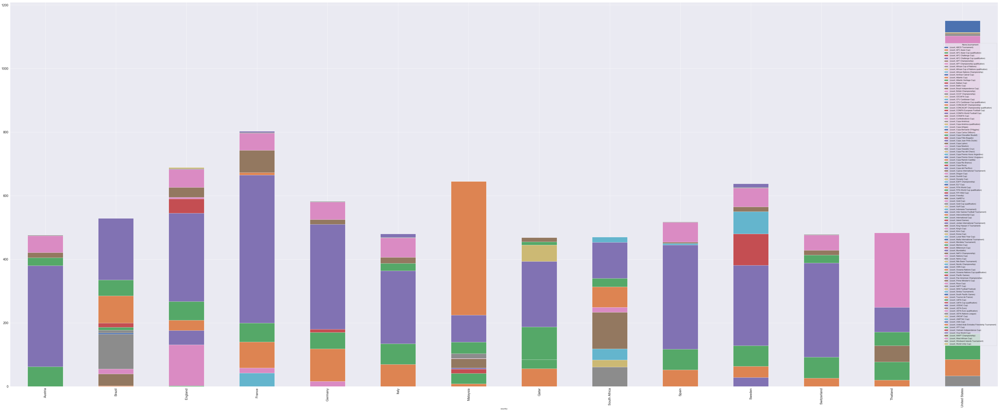

In [65]:
temp1.plot(kind='bar',fontsize=18,stacked=True,figsize=(100,40))